<a href="https://colab.research.google.com/github/SahilCarterr/Convolution-Neural-Network-Basic-Models/blob/Updates/Food101/04_Tracking_multiple_models_results.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 0.Getting Setup

In [1]:
import torch
import torchvision
print(torch.__version__)
print(torchvision.__version__)

2.2.1+cu121
0.17.1+cu121


In [2]:
import matplotlib.pyplot as plt
from torch import nn
from torchvision import transforms
try:
  from torchinfo import summary
except:
  print("Couldn't find torchinfo....")
  !pip install -q torchinfo
  from torchinfo import summary
!git clone https://github.com/SahilCarterr/Convolution-Neural-Network-Basic-Models
!mv Convolution-Neural-Network-Basic-Models/Food101/going_modular .
!mv Convolution-Neural-Network-Basic-Models/Food101/data .
!rm -rf Convolution-Neural-Network-Basic-Models

Couldn't find torchinfo....
Cloning into 'Convolution-Neural-Network-Basic-Models'...
remote: Enumerating objects: 439, done.
remote: Counting objects: 100% (122/122), done.
remote: Compressing objects: 100% (79/79), done.
remote: Total 439 (delta 47), reused 106 (delta 39), pack-reused 317
Receiving objects: 100% (439/439), 96.21 MiB | 22.33 MiB/s, done.
Resolving deltas: 100% (48/48), done.


In [3]:
device="cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [4]:
def set_seeds(seed: int=42):
  torch.manual_seed(42)
  torch.cuda.manual_seed(42)

## 1.Get data

In [5]:
from pathlib import Path
data_path = Path("data/")
image_path = data_path /"pizza_steak_sushi"
image_path

PosixPath('data/pizza_steak_sushi')

## 2. Create Datasets and Dataloaders

### 2.1 Create DataLoaders using Manually created transforms

In [6]:
train_dir = image_path / "train"
test_dir = image_path / "test"
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
manual_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    normalize
])
print(f"Manually creates Transforms : {manual_transforms}")
from going_modular import data_setup
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(
    train_dir=train_dir,
    test_dir=test_dir,
    transform=manual_transforms,
    batch_size=32
)
train_dataloader, test_dataloader, class_names

Manually creates Transforms : Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


(<torch.utils.data.dataloader.DataLoader at 0x7e7f81d91c30>,
 ['pizza', 'steak', 'sushi'])

### 2.2 Create DataLoaders using automatically created transforms

In [7]:
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
automatic_transforms = weights.transforms()
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(
    train_dir=train_dir,
    test_dir=test_dir,
    transform=automatic_transforms,
    batch_size=32
)
train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7e7f81d92110>,
 ['pizza', 'steak', 'sushi'])

## 3. Getting a pretrained model, freezing the base layers and changing the classifier

In [8]:
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
model = torchvision.models.efficientnet_b0(weights=weights).to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 73.4MB/s]


In [9]:
for param in model.features.parameters():
  param.requires_grad = False
set_seeds()
model.classifier = torch.nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(in_features=1280,
              out_features=len(class_names),
              bias=True).to(device))

## 4. Train model and track result

In [10]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [11]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

In [12]:
from typing import Dict, List
from tqdm.auto import tqdm
from going_modular.engine import train_step, test_step


def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:

    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }


    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn,
                                           optimizer=optimizer,
                                           device=device)
        test_loss, test_acc = test_step(model=model,
                                        dataloader=test_dataloader,
                                        loss_fn=loss_fn,
                                        device=device)


        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )


        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)


        writer.add_scalars(main_tag="Loss",
                           tag_scalar_dict={"train_loss": train_loss,
                                            "test_loss": test_loss},
                           global_step=epoch)


        writer.add_scalars(main_tag="Accuracy",
                           tag_scalar_dict={"train_acc": train_acc,
                                            "test_acc": test_acc},
                           global_step=epoch)


        writer.add_graph(model=model,
                         # Pass in an example input
                         input_to_model=torch.randn(32, 3, 224, 224).to(device))


    writer.close()


    return results

In [13]:
set_seeds()
results = train(model=model,
                train_dataloader=train_dataloader,
                test_dataloader=test_dataloader,
                optimizer=optimizer,
                loss_fn=loss_fn,
                epochs=5,
                device=device)

  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 1.0924 | train_acc: 0.3984 | test_loss: 0.9133 | test_acc: 0.5398
Epoch: 2 | train_loss: 0.8975 | train_acc: 0.6562 | test_loss: 0.7837 | test_acc: 0.8561
Epoch: 3 | train_loss: 0.8038 | train_acc: 0.7461 | test_loss: 0.6723 | test_acc: 0.8864
Epoch: 4 | train_loss: 0.6770 | train_acc: 0.8516 | test_loss: 0.6699 | test_acc: 0.8049
Epoch: 5 | train_loss: 0.7065 | train_acc: 0.7188 | test_loss: 0.6746 | test_acc: 0.7737


In [14]:
results

{'train_loss': [1.0924270078539848,
  0.8974936828017235,
  0.8037795424461365,
  0.6769560724496841,
  0.7065097987651825],
 'train_acc': [0.3984375, 0.65625, 0.74609375, 0.8515625, 0.71875],
 'test_loss': [0.9132681290308634,
  0.7837486465771993,
  0.672318716843923,
  0.6698532303174337,
  0.6746145089467367],
 'test_acc': [0.5397727272727273,
  0.8560606060606061,
  0.8863636363636364,
  0.8049242424242425,
  0.7736742424242425]}

## 5. View our model's results in TensorBoard

In [15]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## 6. Create a helper function to build `SummaryWriter()` instances

In [16]:
def create_writer(experiment_name: str,
                  model_name: str,
                  extra: str=None)->torch.utils.tensorboard.writer.SummaryWriter():
  from datetime import datetime
  import os
  timestamp = datetime.now().strftime("%Y-%m-%d")
  if extra:
    log_dir = os.path.join("runs", timestamp, experiment_name, model_name, extra)
  else:
    log_dir = os.path.join("runs", timestamp, experiment_name, model_name)
  print(f"[INFO] Created Summaywriter , saving to : {log_dir}...")
  return SummaryWriter(log_dir=log_dir)

In [17]:
example_writer = create_writer(experiment_name="data_10_percent",
                               model_name="effnetb0",
                               extra="5_epochs")

[INFO] Created Summaywriter , saving to : runs/2024-04-23/data_10_percent/effnetb0/5_epochs...


### 6.1 Update the `train()` function to include a writer parameter

In [18]:
from typing import Dict, List
from tqdm.auto import tqdm
from going_modular.engine import train_step, test_step


def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer: torch.utils.tensorboard.writer.SummaryWriter) -> Dict[str, List]:

    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }


    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn,
                                           optimizer=optimizer,
                                           device=device)
        test_loss, test_acc = test_step(model=model,
                                        dataloader=test_dataloader,
                                        loss_fn=loss_fn,
                                        device=device)


        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )


        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)


        writer.add_scalars(main_tag="Loss",
                           tag_scalar_dict={"train_loss": train_loss,
                                            "test_loss": test_loss},
                           global_step=epoch)


        writer.add_scalars(main_tag="Accuracy",
                           tag_scalar_dict={"train_acc": train_acc,
                                            "test_acc": test_acc},
                           global_step=epoch)


        writer.add_graph(model=model,
                         input_to_model=torch.randn(32, 3, 224, 224).to(device))


    writer.close()


    return results

## 7.Setting up a series of modelling experiments

### 7.1 Download different datasets

In [19]:
import os
import zipfile

from pathlib import Path

import requests

def download_data(source: str,
                  destination: str,
                  remove_source: bool = True) -> Path:

    data_path = Path("data/")
    image_path = data_path / destination


    if image_path.is_dir():
        print(f"[INFO] {image_path} directory exists, skipping download.")
    else:
        print(f"[INFO] Did not find {image_path} directory, creating one...")
        image_path.mkdir(parents=True, exist_ok=True)


        target_file = Path(source).name
        with open(data_path / target_file, "wb") as f:
            request = requests.get(source)
            print(f"[INFO] Downloading {target_file} from {source}...")
            f.write(request.content)

        with zipfile.ZipFile(data_path / target_file, "r") as zip_ref:
            print(f"[INFO] Unzipping {target_file} data...")
            zip_ref.extractall(image_path)

        if remove_source:
            os.remove(data_path / target_file)

    return image_path


In [20]:
data_10_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                                     destination="pizza_steak_sushi")

data_20_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip",
                                     destination="pizza_steak_sushi_20_percent")

[INFO] data/pizza_steak_sushi directory exists, skipping download.
[INFO] Did not find data/pizza_steak_sushi_20_percent directory, creating one...
[INFO] Downloading pizza_steak_sushi_20_percent.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip...
[INFO] Unzipping pizza_steak_sushi_20_percent.zip data...


In [21]:
train_dir_10_percent = data_10_percent_path / "train"
train_dir_20_percent = data_20_percent_path / "train"
test_dir = data_10_percent_path / "test"
print(f"Training directory 10%: {train_dir_10_percent}")
print(f"Training directory 20%: {train_dir_20_percent}")
print(f"Testing directory: {test_dir}")

Training directory 10%: data/pizza_steak_sushi/train
Training directory 20%: data/pizza_steak_sushi_20_percent/train
Testing directory: data/pizza_steak_sushi/test


### 7.2 Transform Datasets and create DataLoaders

In [22]:
from torchvision import transforms
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
simple_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    normalize,
])

In [23]:
BATCH_SIZE=32
train_dataloader_10_percent, test_dataloader, class_names = data_setup.create_dataloaders(
    train_dir = train_dir_10_percent,
    test_dir = test_dir,
    transform=simple_transform,
    batch_size=BATCH_SIZE
)
train_dataloader_20_percent, test_dataloader, class_names = data_setup.create_dataloaders(
    train_dir =  train_dir_20_percent,
    test_dir = test_dir,
    transform = simple_transform,
    batch_size = BATCH_SIZE
)

### 7.3 Creating Feature extraction Model

In [24]:
import torchvision
from torchinfo import summary
effnetb2_weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
effnetb2 = torchvision.models.efficientnet_b2(weights = effnetb2_weights)

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 154MB/s]


In [25]:
effnetb2.classifier

Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1408, out_features=1000, bias=True)
)

In [26]:
print(f"Number of an in_features to final layer of EfficientNetB2:{len(effnetb2.classifier.state_dict()['1.weight'][0])}")

Number of an in_features to final layer of EfficientNetB2:1408


In [27]:
summary(model=effnetb2,
        input_size=(32, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

In [28]:
import torchvision
from torch import nn
OUT_FEATURES = len(class_names)
def create_effnetb0():
  weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
  model = torchvision.models.efficientnet_b0(weights = weights).to(device)
  for param in model.features.parameters():
    param.requires_grad = False
  set_seeds()
  model.classifier = nn.Sequential(
      nn.Dropout(p=0.2),
      nn.Linear(in_features = 1280, out_features=OUT_FEATURES)
  ).to(device)
  model.name = "effnetb0"
  print(f"[INFO] Created new {model.name} model.")
  return model

def create_effnetb2():
  weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
  model = torchvision.models.efficientnet_b2(weights = weights).to(device)
  for param in model.features.parameters():
    param.requires_grad = False
  set_seeds()
  model.classifier = nn.Sequential(
      nn.Dropout(p=0.2),
      nn.Linear(in_features=1408, out_features=OUT_FEATURES)
  ).to(device)
  model.name = "effnetb2"
  print(f"[INFO] Created new {model.name} model.")
  return model

In [29]:
effnetb0 = create_effnetb0()
summary(model=effnetb0,
        input_size=(32, 3, 224, 224),
        col_names = ["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

[INFO] Created new effnetb0 model.


Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [30]:
effnetb2 = create_effnetb2()
summary(model=effnetb2,
        input_size=(32, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

[INFO] Created new effnetb2 model.


Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

### 7.4 Create experiments and set up training code

In [31]:
num_epochs = [5, 10]
models = ["effnetb0", "effnetb2"]
train_dataloaders = {
    "data_10_percent": train_dataloader_10_percent,
    "data_20_percent": train_dataloader_20_percent
}

In [32]:
%%time
from going_modular.utils import save_model
set_seeds(seed=42)
experiment_number=0

for dataloader_name, train_dataloader in train_dataloaders.items():
  for epochs in num_epochs:
    for model_name in models:
      experiment_number += 1
      print(f"[INFO] Experiment number : {experiment_number}")
      print(f"[INFO] Model: {model_name}")
      print(f"[INFO] Dataloader: {dataloader_name}")
      print(f"[INFO] Number of epochs: {epochs}")

      if model_name == "effnetb0":
        model  = create_effnetb0()
      else:
        model = create_effnetb2()
      loss_fn = nn.CrossEntropyLoss()
      optimizer = torch.optim.Adam(params = model.parameters(), lr = 0.001)
      train(model=model,
            train_dataloader=train_dataloader,
            test_dataloader=test_dataloader,
            optimizer=optimizer,
            loss_fn=loss_fn,
            epochs=epochs,
            device=device,
            writer=create_writer(experiment_name=dataloader_name,
                                 model_name=model_name,
                                 extra=f"{epochs}_epochs"))
      save_filepath=f"05_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
      save_model(model=model, target_dir="models", model_name=save_filepath)
      print("-"*50 + "\n")

[INFO] Experiment number : 1
[INFO] Model: effnetb0
[INFO] Dataloader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb0 model.
[INFO] Created Summaywriter , saving to : runs/2024-04-23/data_10_percent/effnetb0/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 1.0528 | train_acc: 0.4961 | test_loss: 0.9220 | test_acc: 0.4678
Epoch: 2 | train_loss: 0.9416 | train_acc: 0.5586 | test_loss: 0.8405 | test_acc: 0.5492
Epoch: 3 | train_loss: 0.8284 | train_acc: 0.6914 | test_loss: 0.7338 | test_acc: 0.7841
Epoch: 4 | train_loss: 0.7219 | train_acc: 0.7578 | test_loss: 0.6269 | test_acc: 0.8864
Epoch: 5 | train_loss: 0.6032 | train_acc: 0.8867 | test_loss: 0.5946 | test_acc: 0.8759
[INFO] Saving model to: models/05_effnetb0_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number : 2
[INFO] Model: effnetb2
[INFO] Dataloader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created Summaywriter , saving to : runs/2024-04-23/data_10_percent/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0874 | train_acc: 0.3633 | test_loss: 0.9458 | test_acc: 0.7121
Epoch: 2 | train_loss: 0.8911 | train_acc: 0.6445 | test_loss: 0.8921 | test_acc: 0.6515
Epoch: 3 | train_loss: 0.8365 | train_acc: 0.6367 | test_loss: 0.7912 | test_acc: 0.8456
Epoch: 4 | train_loss: 0.6967 | train_acc: 0.8594 | test_loss: 0.6792 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.7172 | train_acc: 0.7422 | test_loss: 0.6356 | test_acc: 0.8968
[INFO] Saving model to: models/05_effnetb2_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number : 3
[INFO] Model: effnetb0
[INFO] Dataloader: data_10_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created Summaywriter , saving to : runs/2024-04-23/data_10_percent/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0528 | train_acc: 0.4961 | test_loss: 0.9220 | test_acc: 0.4678
Epoch: 2 | train_loss: 0.9416 | train_acc: 0.5586 | test_loss: 0.8405 | test_acc: 0.5492
Epoch: 3 | train_loss: 0.8284 | train_acc: 0.6914 | test_loss: 0.7338 | test_acc: 0.7841
Epoch: 4 | train_loss: 0.7219 | train_acc: 0.7578 | test_loss: 0.6269 | test_acc: 0.8864
Epoch: 5 | train_loss: 0.6032 | train_acc: 0.8867 | test_loss: 0.5946 | test_acc: 0.8759
Epoch: 6 | train_loss: 0.5470 | train_acc: 0.8750 | test_loss: 0.6074 | test_acc: 0.8258
Epoch: 7 | train_loss: 0.6480 | train_acc: 0.7188 | test_loss: 0.6108 | test_acc: 0.8258
Epoch: 8 | train_loss: 0.5016 | train_acc: 0.9180 | test_loss: 0.5530 | test_acc: 0.8968
Epoch: 9 | train_loss: 0.4611 | train_acc: 0.8945 | test_loss: 0.5423 | test_acc: 0.8864
Epoch: 10 | train_loss: 0.5681 | train_acc: 0.7539 | test_loss: 0.4906 | test_acc: 0.8864
[INFO] Saving model to: models/05_effnetb0_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0874 | train_acc: 0.3633 | test_loss: 0.9458 | test_acc: 0.7121
Epoch: 2 | train_loss: 0.8911 | train_acc: 0.6445 | test_loss: 0.8921 | test_acc: 0.6515
Epoch: 3 | train_loss: 0.8365 | train_acc: 0.6367 | test_loss: 0.7912 | test_acc: 0.8456
Epoch: 4 | train_loss: 0.6967 | train_acc: 0.8594 | test_loss: 0.6792 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.7172 | train_acc: 0.7422 | test_loss: 0.6356 | test_acc: 0.8968
Epoch: 6 | train_loss: 0.5974 | train_acc: 0.7773 | test_loss: 0.6453 | test_acc: 0.8665
Epoch: 7 | train_loss: 0.5742 | train_acc: 0.8320 | test_loss: 0.5897 | test_acc: 0.9280
Epoch: 8 | train_loss: 0.5251 | train_acc: 0.8242 | test_loss: 0.5878 | test_acc: 0.8873
Epoch: 9 | train_loss: 0.5036 | train_acc: 0.8008 | test_loss: 0.5516 | test_acc: 0.8769
Epoch: 10 | train_loss: 0.5037 | train_acc: 0.8203 | test_loss: 0.5450 | test_acc: 0.9081
[INFO] Saving model to: models/05_effnetb2_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9576 | train_acc: 0.6188 | test_loss: 0.6544 | test_acc: 0.8655
Epoch: 2 | train_loss: 0.7022 | train_acc: 0.8063 | test_loss: 0.5732 | test_acc: 0.9072
Epoch: 3 | train_loss: 0.5836 | train_acc: 0.8375 | test_loss: 0.4958 | test_acc: 0.8977
Epoch: 4 | train_loss: 0.4559 | train_acc: 0.8938 | test_loss: 0.4130 | test_acc: 0.9176
Epoch: 5 | train_loss: 0.4514 | train_acc: 0.8938 | test_loss: 0.3819 | test_acc: 0.9280
[INFO] Saving model to: models/05_effnetb0_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number : 6
[INFO] Model: effnetb2
[INFO] Dataloader: data_20_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created Summaywriter , saving to : runs/2024-04-23/data_20_percent/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9750 | train_acc: 0.5625 | test_loss: 0.7672 | test_acc: 0.8153
Epoch: 2 | train_loss: 0.7013 | train_acc: 0.8146 | test_loss: 0.6498 | test_acc: 0.8864
Epoch: 3 | train_loss: 0.5562 | train_acc: 0.8833 | test_loss: 0.5453 | test_acc: 0.9280
Epoch: 4 | train_loss: 0.5111 | train_acc: 0.8729 | test_loss: 0.5063 | test_acc: 0.9280
Epoch: 5 | train_loss: 0.4626 | train_acc: 0.8646 | test_loss: 0.4380 | test_acc: 0.9489
[INFO] Saving model to: models/05_effnetb2_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number : 7
[INFO] Model: effnetb0
[INFO] Dataloader: data_20_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created Summaywriter , saving to : runs/2024-04-23/data_20_percent/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9576 | train_acc: 0.6188 | test_loss: 0.6544 | test_acc: 0.8655
Epoch: 2 | train_loss: 0.7022 | train_acc: 0.8063 | test_loss: 0.5732 | test_acc: 0.9072
Epoch: 3 | train_loss: 0.5836 | train_acc: 0.8375 | test_loss: 0.4958 | test_acc: 0.8977
Epoch: 4 | train_loss: 0.4559 | train_acc: 0.8938 | test_loss: 0.4130 | test_acc: 0.9176
Epoch: 5 | train_loss: 0.4514 | train_acc: 0.8938 | test_loss: 0.3819 | test_acc: 0.9280
Epoch: 6 | train_loss: 0.4222 | train_acc: 0.8604 | test_loss: 0.3728 | test_acc: 0.9280
Epoch: 7 | train_loss: 0.3849 | train_acc: 0.8583 | test_loss: 0.3362 | test_acc: 0.9280
Epoch: 8 | train_loss: 0.3451 | train_acc: 0.8938 | test_loss: 0.3426 | test_acc: 0.9384
Epoch: 9 | train_loss: 0.3723 | train_acc: 0.8917 | test_loss: 0.3382 | test_acc: 0.9280
Epoch: 10 | train_loss: 0.3593 | train_acc: 0.8938 | test_loss: 0.2789 | test_acc: 0.9176
[INFO] Saving model to: models/05_effnetb0_data_20_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9750 | train_acc: 0.5625 | test_loss: 0.7672 | test_acc: 0.8153
Epoch: 2 | train_loss: 0.7013 | train_acc: 0.8146 | test_loss: 0.6498 | test_acc: 0.8864
Epoch: 3 | train_loss: 0.5562 | train_acc: 0.8833 | test_loss: 0.5453 | test_acc: 0.9280
Epoch: 4 | train_loss: 0.5111 | train_acc: 0.8729 | test_loss: 0.5063 | test_acc: 0.9280
Epoch: 5 | train_loss: 0.4626 | train_acc: 0.8646 | test_loss: 0.4380 | test_acc: 0.9489
Epoch: 6 | train_loss: 0.3622 | train_acc: 0.9062 | test_loss: 0.4533 | test_acc: 0.9280
Epoch: 7 | train_loss: 0.3447 | train_acc: 0.9062 | test_loss: 0.4066 | test_acc: 0.9384
Epoch: 8 | train_loss: 0.3077 | train_acc: 0.9354 | test_loss: 0.4071 | test_acc: 0.9280
Epoch: 9 | train_loss: 0.3261 | train_acc: 0.9417 | test_loss: 0.4246 | test_acc: 0.8977
Epoch: 10 | train_loss: 0.3513 | train_acc: 0.8729 | test_loss: 0.3683 | test_acc: 0.9384
[INFO] Saving model to: models/05_effnetb2_data_20_percent_10_epochs.pth
------------------------------------

In [33]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 8366), started 0:06:59 ago. (Use '!kill 8366' to kill it.)

<IPython.core.display.Javascript object>

## 9 Load in the best model and predictions with it

In [35]:
best_model_path = "models/05_effnetb2_data_20_percent_10_epochs.pth"
best_model = create_effnetb2()
best_model.load_state_dict(torch.load(best_model_path))

[INFO] Created new effnetb2 model.


<All keys matched successfully>

In [36]:
from pathlib import Path
effnetb2_model_size = Path(best_model_path).stat().st_size // (1024*1024)
print(f"EfficientNetB2 feature extractor model size: {effnetb2_model_size} MB")

EfficientNetB2 feature extractor model size: 29 MB


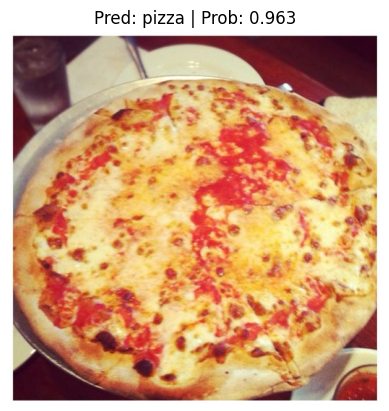

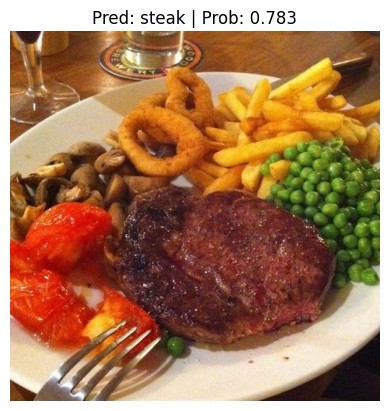

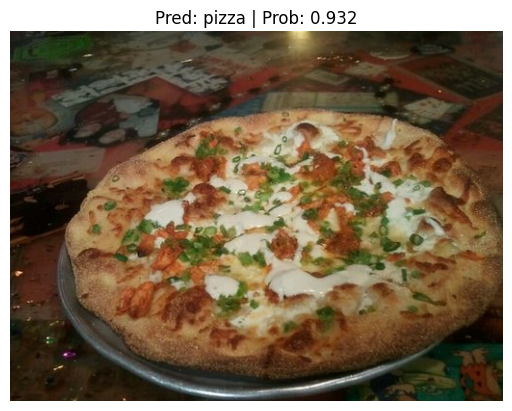

In [38]:
from going_modular.predictions import pred_and_plot_image
import random
num_images_to_plot = 3
test_image_path_list = list(Path(data_20_percent_path/"test").glob("*/*.jpg"))
test_image_path_sample = random.sample(population=test_image_path_list,
                                       k=num_images_to_plot)
for image_path in test_image_path_sample:
  pred_and_plot_image(model=best_model,
                      image_path=image_path,
                      class_names=class_names,
                      image_size=(224, 224))

### 9.1 Predict on a custom image with the best model

In [43]:
!wget https://c8.alamy.com/comp/TTDKJJ/little-boy-holding-pizza-isolated-on-white-TTDKJJ.jpg -O new_img.jpg
custom_image_path = "new_img.jpg"

--2024-04-23 06:58:52--  https://c8.alamy.com/comp/TTDKJJ/little-boy-holding-pizza-isolated-on-white-TTDKJJ.jpg
Resolving c8.alamy.com (c8.alamy.com)... 99.86.38.38, 99.86.38.68, 99.86.38.46, ...
Connecting to c8.alamy.com (c8.alamy.com)|99.86.38.38|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘new_img.jpg’

new_img.jpg             [ <=>                ] 146.03K  --.-KB/s    in 0.02s   

Last-modified header invalid -- time-stamp ignored.
2024-04-23 06:58:52 (9.17 MB/s) - ‘new_img.jpg’ saved [149532]



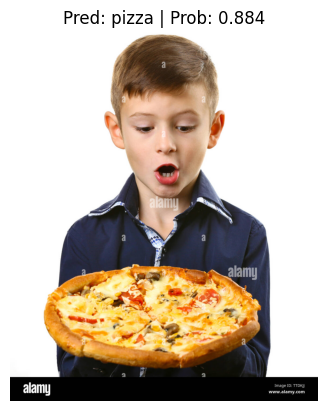

In [44]:
pred_and_plot_image(model=best_model,
                    image_path=custom_image_path,
                    class_names=class_names)